<a href="https://colab.research.google.com/github/naenumtou/statisticalModel/blob/main/slidingWindow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [62]:
# Import libraries
import urllib
import numpy as np
import cv2
import matplotlib.pyplot as plt
import imageio

from IPython.display import Image

%config InlineBackend.figure_format = 'retina'

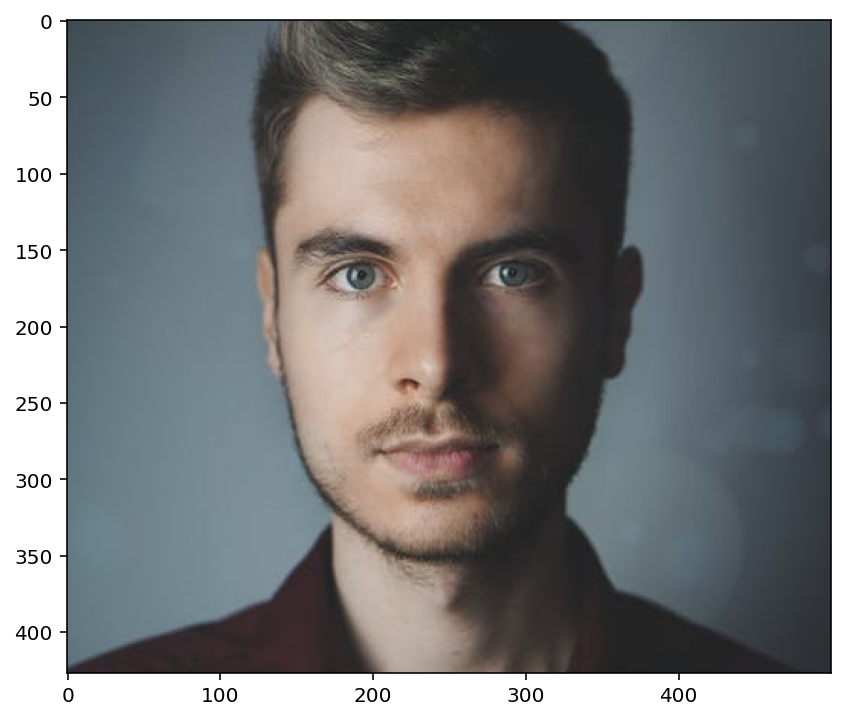

In [66]:
# Read image from URL
url = 'https://raw.githubusercontent.com/naenumtou/statisticalModel/main/datasets/faceSample.jpg'

resp = urllib.request.urlopen(url).read()
imageTest = np.asarray(
    bytearray(resp),
    dtype = 'uint8'
)
imageTest = cv2.imdecode(imageTest, cv2.IMREAD_COLOR)
plt.figure(figsize = (10, 6))
plt.imshow(imageTest[:, :, ::-1])
plt.show()

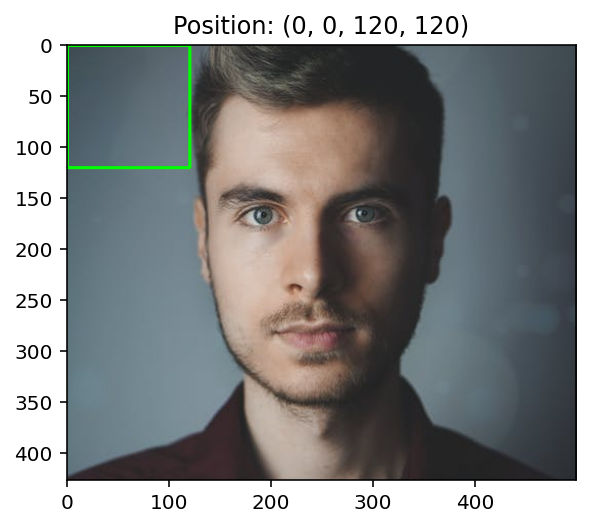

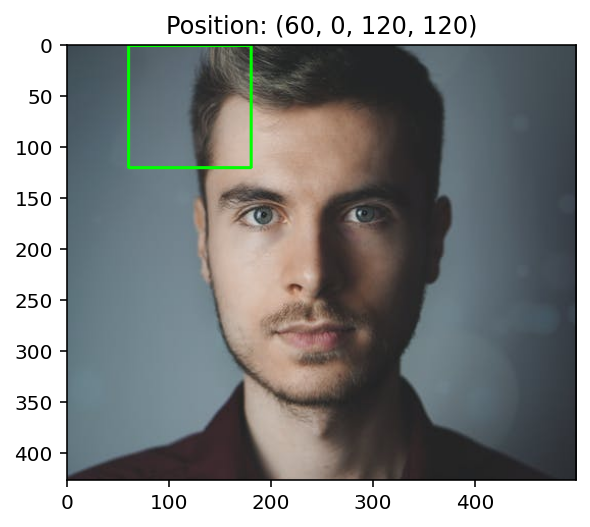

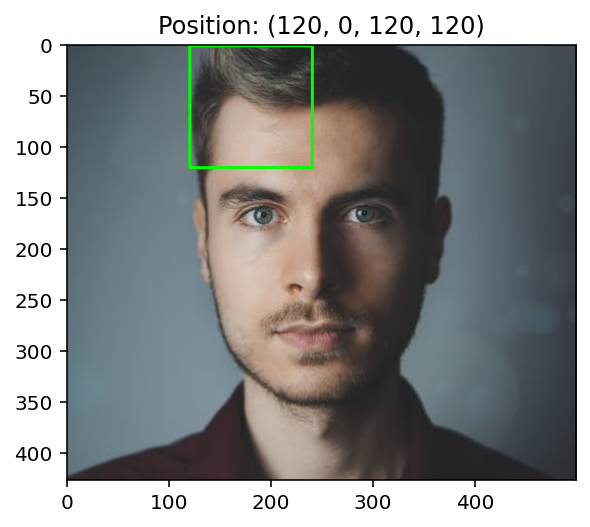

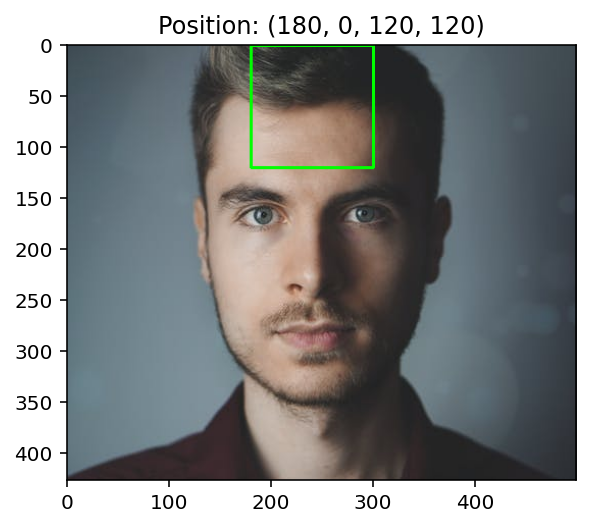

In [73]:
# Define parameters
w = 120
h = 120
steps = 60

# Define sliding window
def slidingWindow(image, stepSize, windowSize):
  for y in range(0, image.shape[0], stepSize):
    for x in range(0, image.shape[1], stepSize):
      yield (x, y, image[y:y + windowSize[1], x:x + windowSize[0]])

for i, (x, y, window) in enumerate(slidingWindow(imageTest, stepSize = steps, windowSize = (h, w))):
  imageCopy = imageTest.copy()
  cv2.rectangle(imageCopy, (x, y), (x + w, y + h), (0, 255, 0), 2)
  plt.imshow(imageCopy[:, :, ::-1])
  plt.title(f'Position: {x, y, h, w}')
  plt.show()
  if i == 3:
    break

In [74]:
# Create gif
gifs =[]

for (x, y, window) in slidingWindow(imageTest, stepSize = steps, windowSize = (h, w)):
  imageCopy = imageTest.copy()
  cv2.rectangle(imageCopy, (x, y), (x + w, y + h), (0, 255, 0), 2)
  gifs.append(imageCopy[:, :, ::-1])

# Save as gif
with imageio.get_writer('facecSample.gif', mode = 'I') as writer:
  for i, img in enumerate(gifs):
    if i % 10 == 0:
      print(f'Appending images: {i}')
    writer.append_data(img)

Appending images: 0
Appending images: 10
Appending images: 20
Appending images: 30
Appending images: 40
Appending images: 50
Appending images: 60
Appending images: 70


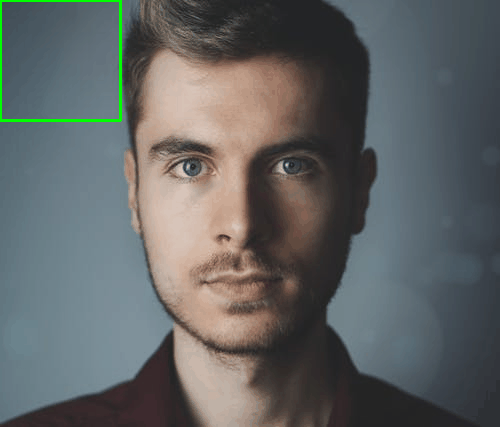

In [76]:
# Display GIF in Colab
Image(open('facecSample.gif', 'rb').read())